In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# !pip install nltk

In [3]:
# !pip install wordcloud

In [3]:
import nltk

In [5]:
# nltk.download()

In [5]:
reviews = pd.read_csv("C:/Users/Aakash Sharma/Desktop/Unstructured data/NLP/K8 Reviews v0.2.csv")

In [6]:
reviews.head()

,sentiment,review
0,1,Good but need updates and improvements
1,0,"Worst mobile i have bought ever, Battery is dr..."
2,1,when I will get my 10% cash back.... its alrea...
3,1,Good
4,0,The worst phone everThey have changed the last...


In [7]:
# Dataset if scrapped from Amazon for lenovo K8 mobile phones
# Reviews in the form of free text text was scrapped 
# A user rating of 1,2,3 -> sentiment 0
# A user rating of 4 and 5 -> sentiment 1

In [8]:
reviews.shape

(14675, 2)

In [9]:
reviews.sentiment.value_counts()

0    7712
1    6963
Name: sentiment, dtype: int64

Get the word Cloud:
    1. combine all the reviews into a single string
    2. Instantiate word cloud
    3. generate the word cloud

In [10]:
from wordcloud import WordCloud

In [11]:
all_reviews=[]
for i in reviews['review']:
    all_reviews.append(i)
# all_reviews    

In [12]:
# OR

reviews_combine = ' '.join(reviews.review.values)
reviews_combine

'Good but need updates and improvements Worst mobile i have bought ever, Battery is draining like hell, backup is only 6 to 7 hours with internet uses, even if I put mobile idle its getting discharged.This is biggest lie from Amazon & Lenove which is not at all expected, they are making full by saying that battery is 4000MAH & booster charger is fake, it takes at least 4 to 5 hours to be fully charged.Don\'t know how Lenovo will survive by making full of us.Please don;t go for this else you will regret like me. when I will get my 10% cash back.... its already 15 January.. Good The worst phone everThey have changed the last phone but the problem is still same and the amazon is not returning the phone .Highly disappointing of amazon Only I\'m telling don\'t buyI\'m totally disappointedPoor batteryPoor cameraWaste of money Phone is awesome. But while charging, it heats up allot..Really a genuine reason to hate Lenovo k8 note The battery level has worn down It\'s over hitting problems...an

In [13]:
word_cloud = WordCloud().generate(reviews_combine)

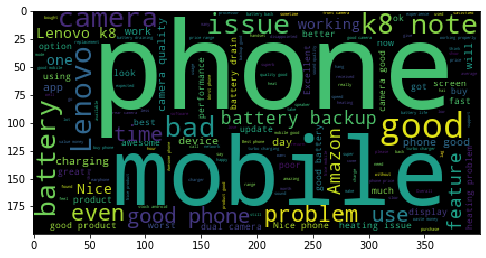

In [14]:
plt.figure(figsize = [8,8])
plt.imshow(word_cloud)
plt.show()

In [15]:
word_cloud = WordCloud(width = 800, height = 800, background_color='white', max_words = 150).generate(reviews_combine)

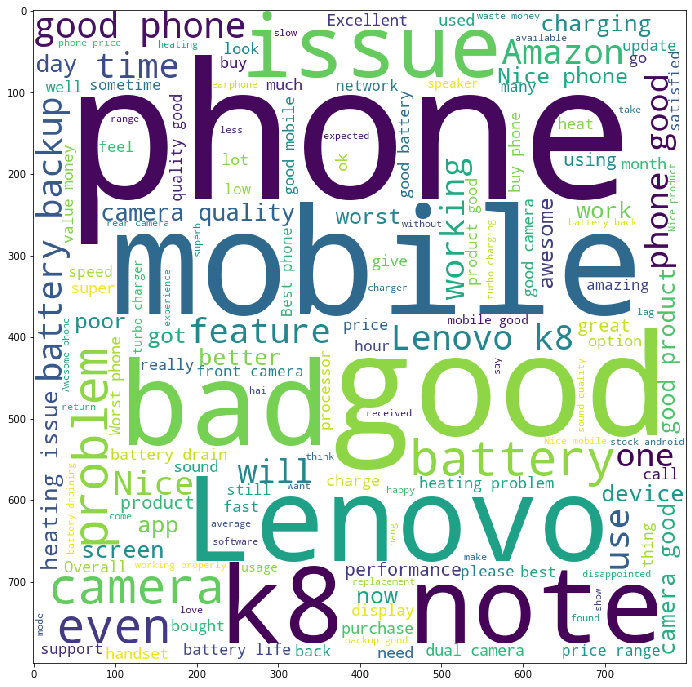

In [16]:
plt.figure(figsize = [12,12])
plt.imshow(word_cloud)
plt.show()

### Bar graph of top 25 used words

1. get the words and frequencies 
2. sort based on frequencies and get the top 25 words
3. plot the bar graph

In [17]:
word_freq={}
all_items = []
all_items =reviews_combine.split(' ')
for i in all_items:
    word_freq[i] = word_freq.get(i,0) + 1
sorted(word_freq)

['',
 '!',
 '!!',
 '!!!',
 '!!!!!',
 '!!!!!!!!!!!!',
 '!!!!!!Trust',
 "!!!Don't",
 '!!3.plastic',
 '!!At',
 '!!Battery',
 '!!Dual',
 '!!Front',
 '!!Gaming',
 '!!Headphone',
 '!!Heating',
 '!!If',
 '!!Love',
 '!!Not',
 '!!WIFI',
 '!!phone',
 '!)',
 '!4gbram64gb',
 '!Buy',
 '!Honest',
 '!The',
 '!Unexpected',
 '!👌👌👌',
 '"',
 '","dailer","ultimate',
 '"ASK',
 '"Any',
 '"Device',
 '"Dolby',
 '"Dont',
 '"Dual',
 '"Fast',
 '"Forget',
 '"Good',
 '"Handset,',
 '"Jack',
 '"K8',
 '"Killer',
 '"LeEco',
 '"Lenovo',
 '"Makkhan",',
 '"PASS',
 '"Process',
 '"Rapid',
 '"Screenshot',
 '"Stock',
 '"THERE',
 '"TURBO".',
 '"The',
 '"Theatre',
 '"USELESS".One',
 '"Whats',
 '"Worst',
 '"activity',
 '"always"',
 '"amazon"',
 '"amazon.in"',
 '"ask',
 '"battery',
 '"bokeh"',
 '"bro',
 '"broken"',
 '"but',
 '"charge',
 '"cheap".Sajad',
 '"close',
 '"depth',
 '"escalating,',
 '"i',
 '"just',
 '"killer"',
 '"lenevo".',
 '"lenovo',
 '"major"',
 '"moto"',
 '"no',
 '"on',
 '"order',
 '"out',
 '"perfect"',
 '"phone',

In [18]:
freq = {'words':list(word_freq.keys()),'freq':list(word_freq.values())}
df_freq = pd.DataFrame(freq)
plot_df = df_freq.sort_values(ascending = False, by = 'freq')
plot_df.head()

,words,freq
13,is,10151
94,the,5565
41,not,5162
4,and,5078
91,phone,4766


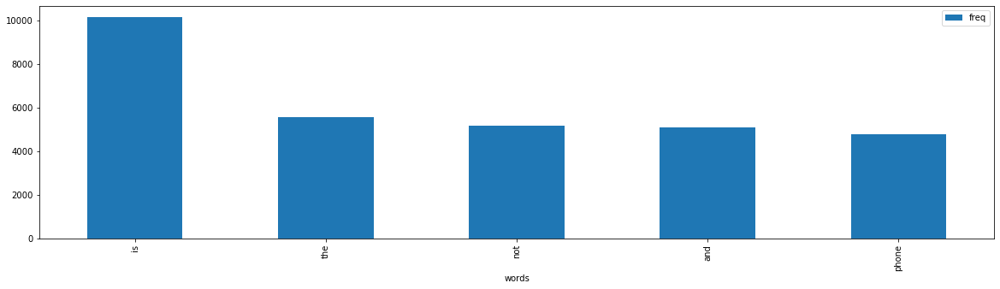

In [19]:
plot_df.head().plot.bar(x = 'words',y = 'freq', figsize=(20,5))

Problems with these visuals:
    1. Too many distinct words in the corpus of reviews
        1. text is non uniform case
        2. punctuation present in the test
        3. there are language connectors in the text - stop words
        4. words with different forms/tenses - charge, charged, charging

Text Processing:
    1. Text Cleaning
    2. Get the visuals - word cloud and bar graph or frequency graph
    3. Converting text to numeric metrices
    4. Advanced visuals using collocation (n-gram - unigrams, bigrams, trigrams)
    5. Sentiment analysis and sentiment classification
    6. text classification 
    7. document clustering

## `Tokenizing`

In [20]:
from nltk.tokenize import word_tokenize

In [21]:
all_terms = word_tokenize(reviews_combine.lower())
print(all_terms)

['good', 'but', 'need', 'updates', 'and', 'improvements', 'worst', 'mobile', 'i', 'have', 'bought', 'ever', ',', 'battery', 'is', 'draining', 'like', 'hell', ',', 'backup', 'is', 'only', '6', 'to', '7', 'hours', 'with', 'internet', 'uses', ',', 'even', 'if', 'i', 'put', 'mobile', 'idle', 'its', 'getting', 'discharged.this', 'is', 'biggest', 'lie', 'from', 'amazon', '&', 'lenove', 'which', 'is', 'not', 'at', 'all', 'expected', ',', 'they', 'are', 'making', 'full', 'by', 'saying', 'that', 'battery', 'is', '4000mah', '&', 'booster', 'charger', 'is', 'fake', ',', 'it', 'takes', 'at', 'least', '4', 'to', '5', 'hours', 'to', 'be', 'fully', 'charged.do', "n't", 'know', 'how', 'lenovo', 'will', 'survive', 'by', 'making', 'full', 'of', 'us.please', 'don', ';', 't', 'go', 'for', 'this', 'else', 'you', 'will', 'regret', 'like', 'me', '.', 'when', 'i', 'will', 'get', 'my', '10', '%', 'cash', 'back', '...', '.', 'its', 'already', '15', 'january..', 'good', 'the', 'worst', 'phone', 'everthey', 'have

In [22]:
from nltk.tokenize import wordpunct_tokenize

In [23]:
print(wordpunct_tokenize(reviews_combine))

['Good', 'but', 'need', 'updates', 'and', 'improvements', 'Worst', 'mobile', 'i', 'have', 'bought', 'ever', ',', 'Battery', 'is', 'draining', 'like', 'hell', ',', 'backup', 'is', 'only', '6', 'to', '7', 'hours', 'with', 'internet', 'uses', ',', 'even', 'if', 'I', 'put', 'mobile', 'idle', 'its', 'getting', 'discharged', '.', 'This', 'is', 'biggest', 'lie', 'from', 'Amazon', '&', 'Lenove', 'which', 'is', 'not', 'at', 'all', 'expected', ',', 'they', 'are', 'making', 'full', 'by', 'saying', 'that', 'battery', 'is', '4000MAH', '&', 'booster', 'charger', 'is', 'fake', ',', 'it', 'takes', 'at', 'least', '4', 'to', '5', 'hours', 'to', 'be', 'fully', 'charged', '.', 'Don', "'", 't', 'know', 'how', 'Lenovo', 'will', 'survive', 'by', 'making', 'full', 'of', 'us', '.', 'Please', 'don', ';', 't', 'go', 'for', 'this', 'else', 'you', 'will', 'regret', 'like', 'me', '.', 'when', 'I', 'will', 'get', 'my', '10', '%', 'cash', 'back', '....', 'its', 'already', '15', 'January', '..', 'Good', 'The', 'worst'

In [24]:
len(reviews_combine), len(all_terms)

(1674772, 324233)

In [25]:
from nltk.probability import FreqDist

In [26]:
fdist = FreqDist(all_terms)
fdist

FreqDist({'.': 13530, 'is': 10386, ',': 6890, 'phone': 6565, 'the': 6526, 'not': 6030, 'good': 5717, 'and': 5413, 'it': 5375, 'to': 4697, ...})

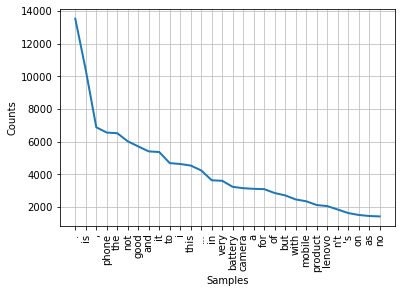

In [27]:
fdist.plot(30, cumulative = False)
plt.show()

## `Removing Stopwords and punctuation`

In [28]:
from string import punctuation

In [29]:
from nltk.corpus import stopwords

In [30]:
stop_nltk = stopwords.words("english")

stop_updated = stop_nltk + ["...","..","mobile","phone","lenovo","k8","note","n't"]

In [31]:
without_punct_stopwords = []
for i in all_terms:
    if i not in stop_updated and i not in list(punctuation) and len(i)>2:
        without_punct_stopwords.append(i)
len(set(without_punct_stopwords))     

18475

In [32]:
print(without_punct_stopwords[:200])

['good', 'need', 'updates', 'improvements', 'worst', 'bought', 'ever', 'battery', 'draining', 'like', 'hell', 'backup', 'hours', 'internet', 'uses', 'even', 'put', 'idle', 'getting', 'discharged.this', 'biggest', 'lie', 'amazon', 'lenove', 'expected', 'making', 'full', 'saying', 'battery', '4000mah', 'booster', 'charger', 'fake', 'takes', 'least', 'hours', 'fully', 'charged.do', 'know', 'survive', 'making', 'full', 'us.please', 'else', 'regret', 'like', 'get', 'cash', 'back', 'already', 'january..', 'good', 'worst', 'everthey', 'changed', 'last', 'problem', 'still', 'amazon', 'returning', '.highly', 'disappointing', 'amazon', 'telling', 'buyi', 'totally', 'disappointedpoor', 'batterypoor', 'camerawaste', 'money', 'awesome', 'charging', 'heats', 'allot..really', 'genuine', 'reason', 'hate', 'battery', 'level', 'worn', 'hitting', 'problems', 'hanging', 'problems', 'service', 'station', 'ahmedabad', 'one', 'years', 'warranty', 'change', 'lot', 'glitches', 'dont', 'buy', 'thing', 'better',

## `Stemming`

In [33]:
from nltk.stem import SnowballStemmer

In [34]:
stemmer_s = SnowballStemmer('english')  

word_stemmization1 = []
for i in without_punct_stopwords:
    word_stemmization1.append(stemmer_s.stem(i))

print(word_stemmization1) 

['good', 'need', 'updat', 'improv', 'worst', 'bought', 'ever', 'batteri', 'drain', 'like', 'hell', 'backup', 'hour', 'internet', 'use', 'even', 'put', 'idl', 'get', 'discharged.thi', 'biggest', 'lie', 'amazon', 'lenov', 'expect', 'make', 'full', 'say', 'batteri', '4000mah', 'booster', 'charger', 'fake', 'take', 'least', 'hour', 'fulli', 'charged.do', 'know', 'surviv', 'make', 'full', 'us.pleas', 'els', 'regret', 'like', 'get', 'cash', 'back', 'alreadi', 'january..', 'good', 'worst', 'everthey', 'chang', 'last', 'problem', 'still', 'amazon', 'return', '.high', 'disappoint', 'amazon', 'tell', 'buyi', 'total', 'disappointedpoor', 'batterypoor', 'camerawast', 'money', 'awesom', 'charg', 'heat', 'allot..r', 'genuin', 'reason', 'hate', 'batteri', 'level', 'worn', 'hit', 'problem', 'hang', 'problem', 'servic', 'station', 'ahmedabad', 'one', 'year', 'warranti', 'chang', 'lot', 'glitch', 'dont', 'buy', 'thing', 'better', 'option', 'wrost', 'good', 'charger', 'work', 'damag', 'within', 'month', 

In [35]:
len(set(word_stemmization1))

16161

## `Lemmatization`

In [36]:
from nltk.stem import WordNetLemmatizer

In [37]:
lemm = WordNetLemmatizer()

In [38]:
word_tokenize_new2 = []
for i in without_punct_stopwords:
    word_tokenize_new2.append(lemm.lemmatize(i))

print(word_tokenize_new2) 

['good', 'need', 'update', 'improvement', 'worst', 'bought', 'ever', 'battery', 'draining', 'like', 'hell', 'backup', 'hour', 'internet', 'us', 'even', 'put', 'idle', 'getting', 'discharged.this', 'biggest', 'lie', 'amazon', 'lenove', 'expected', 'making', 'full', 'saying', 'battery', '4000mah', 'booster', 'charger', 'fake', 'take', 'least', 'hour', 'fully', 'charged.do', 'know', 'survive', 'making', 'full', 'us.please', 'else', 'regret', 'like', 'get', 'cash', 'back', 'already', 'january..', 'good', 'worst', 'everthey', 'changed', 'last', 'problem', 'still', 'amazon', 'returning', '.highly', 'disappointing', 'amazon', 'telling', 'buyi', 'totally', 'disappointedpoor', 'batterypoor', 'camerawaste', 'money', 'awesome', 'charging', 'heat', 'allot..really', 'genuine', 'reason', 'hate', 'battery', 'level', 'worn', 'hitting', 'problem', 'hanging', 'problem', 'service', 'station', 'ahmedabad', 'one', 'year', 'warranty', 'change', 'lot', 'glitch', 'dont', 'buy', 'thing', 'better', 'option', 'w

In [39]:
print(len(set(word_tokenize_new2)))

17902


Stemmer reduces the number of dix=stinct words in the corpus to a greater extent

## `UDF`

Lets build a udf:
    1. input: review
    2. Tasks: All the above cleaning steps
    3. Return: Cleaned review
    
Based on the outcomes of this function , you should be able to add a new column in the data frame called as 'cleaned_review

In [40]:
def clean_txt(sent):
    tokens = word_tokenize(sent.lower())
    stemmed = []
    for i in tokens:
        if i not in stop_updated and i not in list(punctuation) and len(i)>2:
            stemmed.append(stemmer_s.stem(i))
    res = " ".join(stemmed)
    return res

In [41]:
reviews['clean_review'] = reviews.review.apply(clean_txt)

In [42]:
reviews.head()

,sentiment,review,clean_review
0,1,Good but need updates and improvements,good need updat improv
1,0,"Worst mobile i have bought ever, Battery is dr...",worst bought ever batteri drain like hell back...
2,1,when I will get my 10% cash back.... its alrea...,get cash back alreadi january..
3,1,Good,good
4,0,The worst phone everThey have changed the last...,worst everthey chang last problem still amazon...


In [43]:
clean_reviews_combine = ' '.join(reviews.clean_review.values)
# clean_reviews_combine

In [44]:
word_cloud = WordCloud(width = 800, height = 800, background_color='white', max_words = 150).generate(clean_reviews_combine)

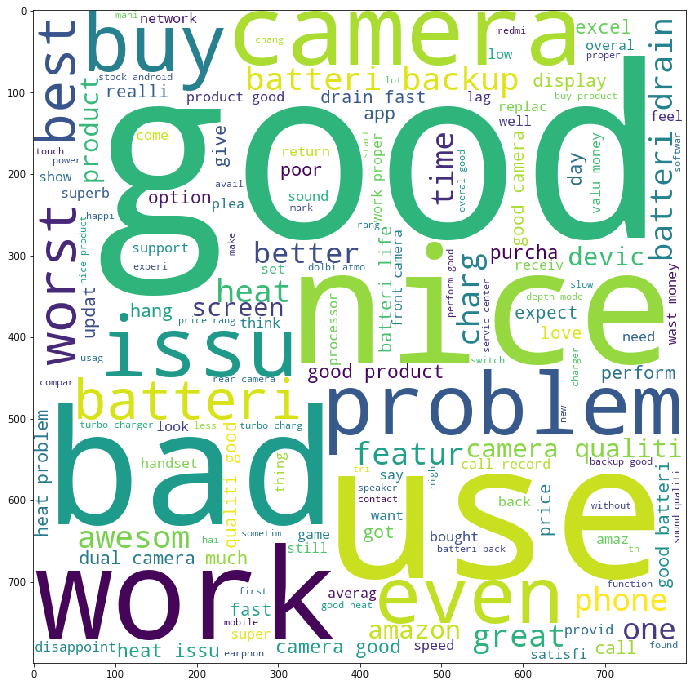

In [45]:
plt.figure(figsize = [12,12])
plt.imshow(word_cloud)
plt.show()

## `DTM`

In [46]:
from sklearn.feature_extraction.text import CountVectorizer

In [47]:
count_vect = CountVectorizer()      # This is called Instantiated

count_vect_bg = CountVectorizer(ngram_range = (2,2)) # That means min 2 bigram and max 2 bigram

x_bg = count_vect_bg.fit_transform(reviews['clean_review'])

In [48]:
#print(count_vect_bg.get_feature_names())

In [49]:
DTM_bg = pd.DataFrame(x_bg.toarray(), columns = count_vect_bg.get_feature_names())
DTM_bg

,00 00,00 box,00 hour,00 realli,00 silent,00 usual,000 000,000 camera,000 discount,000 even,...,இல பலம,என இயல,ஏற லல,ஒன என,கவ ஆடம,பரம இல,பலம ரண,ரண _smart,றப ஒன,லல becaus
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14670,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14671,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14672,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14673,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [50]:
a = DTM_bg.sum().sort_values(ascending = False).head(25)

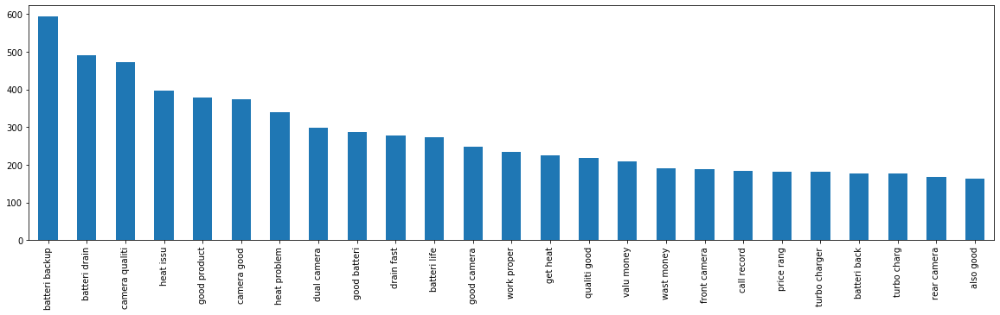

In [51]:
a.plot.bar(x = 'words',y = 'freq', figsize=(20,5)) 

## `TFIDF`

In [52]:
## Find top 5 reviews opf the word batteri backup and Good camera

In [53]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [54]:
tfidf_vect = TfidfVectorizer(ngram_range = (2,2))

In [55]:
X_tfidf = tfidf_vect.fit_transform(reviews['clean_review'])

In [56]:
tfidf = pd.DataFrame(X_tfidf.todense(), columns = tfidf_vect.get_feature_names())
#tfidf.head(10)

In [57]:
tfidf['batteri drain'].sort_values(ascending = False).head(5)

6404    0.665165
6486    0.665165
3130    0.665165
2964    0.665165
112     0.665165
Name: batteri drain, dtype: float64

In [58]:
tfidf['batteri drain'].sort_values(ascending = False).head(5).index

Int64Index([6404, 6486, 3130, 2964, 112], dtype='int64')

In [59]:
tfidf['good camera'].sort_values(ascending = False).head(5).index

Int64Index([13420, 1439, 3127, 10756, 10047], dtype='int64')

In [60]:
reviews.iloc[list(tfidf['batteri drain'].sort_values(ascending = False).head(5).index)]

,sentiment,review,clean_review
6404,1,It's battery is draining too fast,batteri drain fast
6486,0,Battery draining too fast....,batteri drain fast
3130,0,Battery drains very fast,batteri drain fast
2964,0,Battery drain fastly,batteri drain fast
112,0,It's battery is draining very fast.,batteri drain fast


In [61]:
reviews.iloc[list(tfidf['good camera'].sort_values(ascending = False).head(5).index)]

,sentiment,review,clean_review
13420,1,Good Camera,good camera
1439,1,GOOD CAMERA QUALITY,good camera qualiti
3127,1,Good camera quality,good camera qualiti
10756,1,Good camera or mobile is good,good camera good
10047,1,Good Phone Camera is Good,good camera good


## `Sentiment analysis`

### Method 1

In [62]:
afinn = pd.read_csv("C:/Users/Aakash Sharma/Desktop/Unstructured data/NLP/AFINN-111.txt", sep = '\t',header=None, names = ['Term','Score'])
term_scores = dict(afinn.values)
def nlp_sentiment(sentence):
    score = 0
    for i in word_tokenize(sentence):
        score = score + term_scores.get(i,0)
    return score

In [63]:
reviews['sent_score'] = reviews.clean_review.apply(nlp_sentiment)

In [64]:
reviews.head()

,sentiment,review,clean_review,sent_score
0,1,Good but need updates and improvements,good need updat improv,3
1,0,"Worst mobile i have bought ever, Battery is dr...",worst bought ever batteri drain like hell back...,-8
2,1,when I will get my 10% cash back.... its alrea...,get cash back alreadi january..,0
3,1,Good,good,3
4,0,The worst phone everThey have changed the last...,worst everthey chang last problem still amazon...,-7


In [65]:
reviews['sentiment_pred'] = reviews.sent_score.apply(lambda x:1 if x>2 else 0)

In [66]:
reviews.head()

,sentiment,review,clean_review,sent_score,sentiment_pred
0,1,Good but need updates and improvements,good need updat improv,3,1
1,0,"Worst mobile i have bought ever, Battery is dr...",worst bought ever batteri drain like hell back...,-8,0
2,1,when I will get my 10% cash back.... its alrea...,get cash back alreadi january..,0,0
3,1,Good,good,3,1
4,0,The worst phone everThey have changed the last...,worst everthey chang last problem still amazon...,-7,0


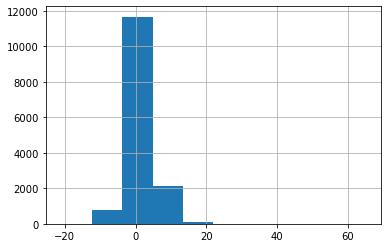

In [67]:
reviews.sent_score.hist()

In [68]:
from sklearn.metrics import confusion_matrix, accuracy_score

In [69]:
accuracy_score(reviews.sentiment, reviews.sentiment_pred)

# Around 71 % of reviews actually matched with the predicted sentiment

0.7364906303236797

In [70]:
confusion_matrix(reviews.sentiment, reviews.sentiment_pred)

array([[6032, 1680],
       [2187, 4776]], dtype=int64)

### Method 2

In [71]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [72]:
analyser = SentimentIntensityAnalyzer()

In [73]:
def get_vadar_sentiment(sentence):
    return analyser.polarity_scores(sentence)['compound']

reviews['compound_score'] = reviews.review.apply(get_vadar_sentiment)

In [74]:
reviews['sentiment2_pred'] = reviews.sent_score.apply(lambda x:1 if x>0.3 else 0)

In [75]:
reviews.head()

,sentiment,review,clean_review,sent_score,sentiment_pred,compound_score,sentiment2_pred
0,1,Good but need updates and improvements,good need updat improv,3,1,0.5994,1
1,0,"Worst mobile i have bought ever, Battery is dr...",worst bought ever batteri drain like hell back...,-8,0,-0.8720,0
2,1,when I will get my 10% cash back.... its alrea...,get cash back alreadi january..,0,0,0.0000,0
3,1,Good,good,3,1,0.4404,1
4,0,The worst phone everThey have changed the last...,worst everthey chang last problem still amazon...,-7,0,-0.8289,0


In [76]:
from sklearn.metrics import confusion_matrix, accuracy_score

In [77]:
accuracy_score(reviews.sentiment, reviews.sentiment2_pred)


0.7118228279386712

## `Sentiment Prediction Strategy 3: Building our own model`

- step 1: get the X and Y
- step 2: Split into test and train
- step 3: converting text to numbers (countvectorizer or tfidfvectorizer)
- step 4: train
- step 5: test and get the accuracy scores

In [78]:
X = reviews.clean_review.values
Y = reviews.sentiment.values

In [79]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

In [80]:
x_train, x_test, y_train, y_test = train_test_split(X,Y,test_size = 0.30, random_state = 0)

In [81]:
count_vect1 = CountVectorizer()

In [82]:
# Extract the features on the reviews for train - fit
# compute the count of every word extracted in every document (review)

x_train_bow = count_vect1.fit_transform(x_train)


In [83]:
# For all the feature extracted  compute the count in the test data set of reviews

x_test_bow = count_vect1.transform(x_test)

In [84]:
print(x_train_bow.shape, x_test_bow.shape)

(10272, 8540) (4403, 8540)


In [85]:
# !pip install xgboost

In [86]:
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier

In [87]:
xg = XGBClassifier(n_estimators=1000)
xg.fit(x_train_bow, y_train)
y_pred = xg.predict(x_test_bow)
#y_pred

In [88]:
accuracy_score(y_test, y_pred)

0.8514649102884397

## `KMeans_clustering`

In [92]:
from sklearn.feature_extraction.text import CountVectorizer
count_vect = CountVectorizer()      # This is called Instantiated

count_vect_ug = CountVectorizer() # That means min 2 bigram and max 2 bigram

x_ug = count_vect_ug.fit_transform(reviews['clean_review'])

DTM_ug = pd.DataFrame(x_ug.toarray(), columns = count_vect_ug.get_feature_names())
DTM_ug

MemoryError: Unable to allocate array with shape (14675, 10697) and data type int64

In [91]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters = 5, random_state = 0)
y_kmeans = kmeans.fit_predict(DTM_ug)

MemoryError: Unable to allocate array with shape (14675, 10697) and data type float64

In [ ]:
def k_cluster(c):
    BOW = count_vect_ug.get_feature_names()
    num_cluster = len(c)
    n = int(input()) 
    argsort_cluster = np.argsort(c)[:,::-1]
    print('Top',n,'terms per cluster:')
    for i in range(num_cluster):
        print('')
        print('Cluster :',i)
        for j in argsort_cluster[i,:n]:
            print(BOW[j])

k_cluster(kmeans.cluster_centers_)